# Demo for page splitting

In [1]:
from ecpo_eynollah import split_pages as sp
from PIL import Image
from pathlib import Path

The images need to be divided into two or three pages, depending on their content. Automatically determining the correct number of splits is challenging, so we currently rely on a configuration parameter to specify the number of segments.

In [2]:
# helper function to display images
def display_image(in_dir: Path, out_dir: Path):
    for img_file in in_dir.iterdir():
        if img_file.suffix.lower() not in [".png", ".jpg", ".jpeg", ".tiff", ".bmp"]:
            continue
        
        input_image = Image.open(img_file)
        images = [input_image]
        
        base_name = img_file.stem
        output_files = list(out_dir.glob(f"{base_name}_p*_*.jpg"))
        output_files.sort()
        images += [Image.open(f) for f in output_files]
        
        # Determine total width and max height
        widths, heights = zip(*(img.size for img in images))

        # scale width and height to a smaller window
        scaled_widths = [int(w * 0.2) for w in widths]
        scaled_heights = [int(h * 0.2) for h in heights]
        scaled_images = [img.resize((w, h)) for img, w, h in zip(images, scaled_widths, scaled_heights)]

        max_width = max(scaled_widths)
        total_height = sum(scaled_heights) + 10 * (len(scaled_images) - 1)  # 10 pixels gap between images
        
        # Create a new blank image
        combined = Image.new('RGB', (max_width, total_height), color=0)
        
        # Paste images side by side
        x_offset = 0
        y_offset = 0
        for img in scaled_images:
            combined.paste(img, (x_offset, y_offset))
            y_offset += img.height + 10  # 10 pixels gap between images
        
        display(combined)

## Two-segment images

In [3]:
# input and output folders
# if there are more than 5 images in the input folder, please use CLI instead
in_dir = Path("../../data/in/sample/2-segs")
out_dir = Path("../../data/out/pagesplit/2-segs")

In [4]:
# use default config but modify input and output dirs
# default config is in ecpo_eynollah/config/default_config.json
new_config = {
    "input_dir": str(in_dir),
    "gutter_detection": {
        "output_dir": str(out_dir),
        "num_segments": 2,
        "gutter_size": 1,
    },
}

In [5]:
# split pages in the input folder and save to the output folder
sp.process_folder(config_path="default", new_config=new_config, unique_tag="notebook-1111")

The config have been saved to ../../data/out/pagesplit/2-segs/used_config_notebook-1111.json


files:   0%|          | 0/2 [00:00<?, ?it/s]Model files already exist. Using cached files. To redownload, please delete the directory manually: `/home/tuyen/.paddlex/official_models/PP-OCRv5_server_det`.
/home/tuyen/anaconda3/envs/ecpo/lib/python3.13/site-packages/paddle/utils/cpp_extension/extension_utils.py:717: UserWarning: No ccache found. Please be aware that recompiling all source files may be required. You can download and install ccache from: https://github.com/ccache/ccache/blob/master/doc/INSTALL.md
  warnings.warn(warning_message)
files: 100%|██████████| 2/2 [00:13<00:00,  6.86s/it]

Processed 2 files.
Output saved to: ../../data/out/pagesplit/2-segs
Fallback to center split used in 0 files.


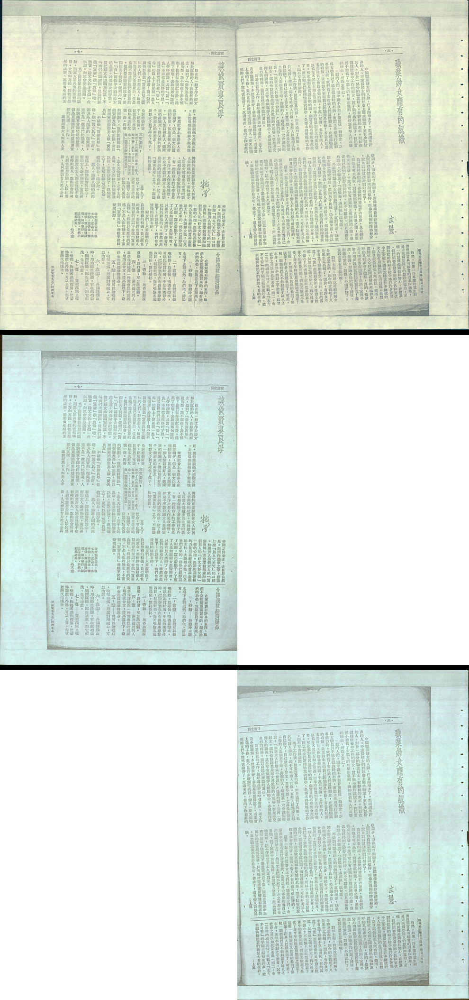

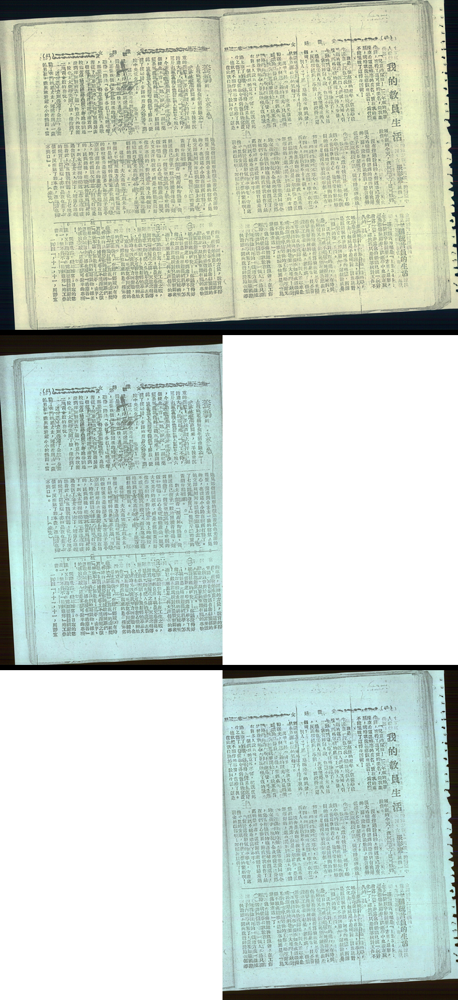

In [6]:
display_image(in_dir, out_dir)

## Three-segment images

In [11]:
# input and output folders
# if there are more than 5 images in the input folder, please use CLI instead
in_dir = Path("../../data/in/sample/3-segs")
out_dir = Path("../../data/out/pagesplit/3-segs")

In [12]:
# use default config but modify input and output dirs
# default config is in ecpo_eynollah/config/default_config.json
new_config = {
    "input_dir": str(in_dir),
    "gutter_detection": {
        "output_dir": str(out_dir),
        "num_segments": 5, # change number of segments!
        "gutter_size": 400,
    },
}

In [13]:
# split pages in the input folder and save to the output folder
sp.process_folder(config_path="default", new_config=new_config, unique_tag="notebook-1111")

The config have been saved to ../../data/out/pagesplit/3-segs/used_config_notebook-1111.json


files: 100%|██████████| 3/3 [00:31<00:00, 10.43s/it]

Processed 3 files.
Output saved to: ../../data/out/pagesplit/3-segs
Fallback to center split used in 0 files.


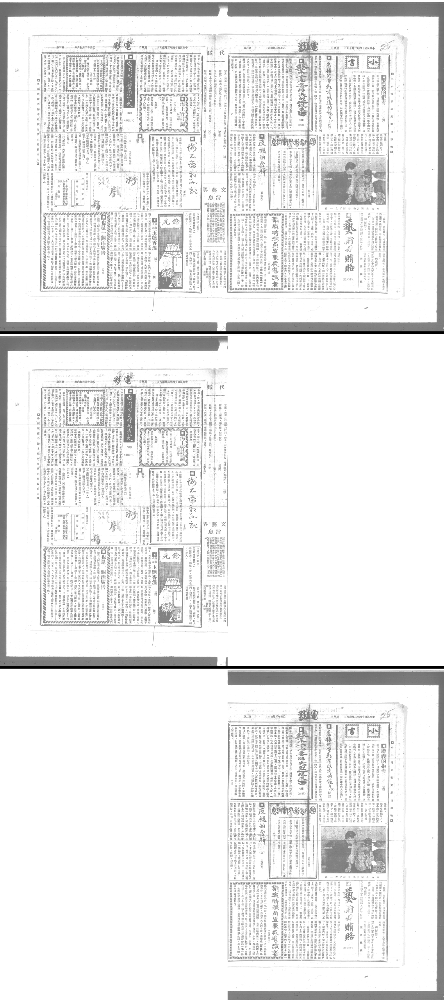

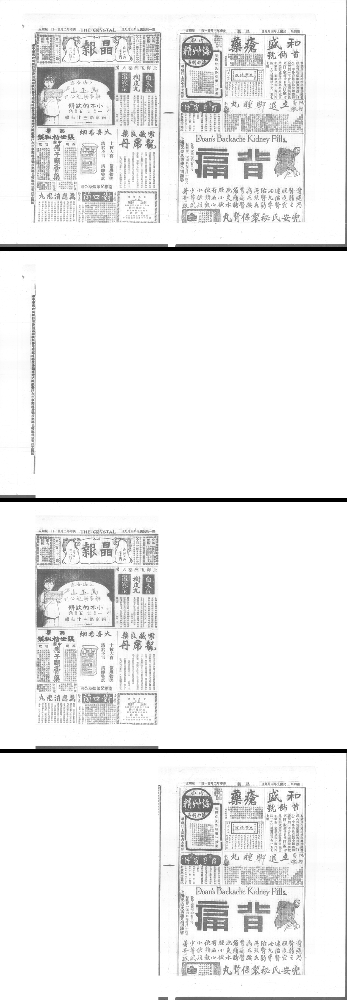

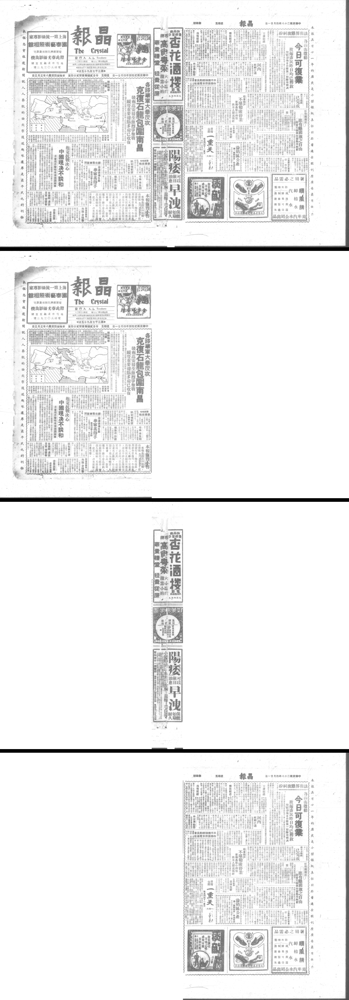

In [14]:
display_image(in_dir, out_dir)